# Practice 3

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import pandas as pd
import skmob
from skmob.utils import plot
import geopandas as gpd
import folium
from tqdm import tqdm
tqdm.pandas()
from folium import plugins
import warnings
import shapely
warnings.filterwarnings('ignore')

## Exercise 1): taxis in Porto

### 1.A Download the <a href="https://archive.ics.uci.edu/ml/datasets/Taxi+Service+Trajectory+-+Prediction+Challenge,+ECML+PKDD+2015">Porto taxi dataset</a> (file `train.csv.zip`) and load the first 20000 trajectories into a `TrajDataFrame`.

In [2]:
def load_trajdataframe():
    df = pd.read_csv('data/train.csv.zip', compression='zip', sep=',', nrows=20000)

    rows = []
    for i, row in tqdm(df.iterrows()):
        uid, tid = row['TAXI_ID'], row['TRIP_ID']
        call_type = row['CALL_TYPE']
        timestamp = row['TIMESTAMP']
        day_type = row['DAY_TYPE']
        for point in eval(row['POLYLINE']):
            rows.append([uid, tid, call_type, timestamp, day_type, point[1], point[0]])
    temp_df = pd.DataFrame(rows, columns=['uid', 'tid', 'call_type', 'datetime', 
                                       'day_type', 'lat', 'lng'])
    temp_df['datetime'] = pd.to_datetime(temp_df['datetime'], unit='s')
    tdf = skmob.TrajDataFrame(temp_df)
    return tdf

In [3]:
tdf = load_trajdataframe()
print(tdf.shape)
tdf.head()

20000it [00:14, 1383.64it/s]


(977757, 7)


,uid,tid,call_type,datetime,day_type,lat,lng
0,20000589,1372636858620000589,C,2013-07-01 00:00:58,A,41.141412,-8.618643
1,20000589,1372636858620000589,C,2013-07-01 00:00:58,A,41.141376,-8.618499
2,20000589,1372636858620000589,C,2013-07-01 00:00:58,A,41.142510,-8.620326
3,20000589,1372636858620000589,C,2013-07-01 00:00:58,A,41.143815,-8.622153
4,20000589,1372636858620000589,C,2013-07-01 00:00:58,A,41.144373,-8.623953


### 1.B Get a square tessellation of Porto (`meters=500`), then plot the tessellation and the trajectories.
- **Note**: there is no available `base_shape` for the city of Porto.
- **Suggestion**: download the grid of a wider region (e.g., "Porto, Tâmega e Sousa, Nord, Portogallo") and select cells within a bounding box of the city.
- To select a bounding box you can use OpenStreetMap (https://www.openstreetmap.org/#map=10/41.0612/-8.5089)

In [4]:
from skmob.tessellation import tilers
min_lat, max_lat = 40.9986, 41.2530
min_lng, max_lng = -8.7300, -8.4217
porto_region_tess = tilers.tiler.get("squared", 
                              base_shape='Porto, Tâmega e Sousa, Nord, Portogallo', 
                              meters=500)
print(porto_region_tess.shape)
porto_region_tess.head()

(17042, 2)


,tile_ID,geometry
0,0,POLYGON ((-8.789062700000001 41.40689590150905...
1,1,POLYGON ((-8.789062700000001 41.41026463784413...
2,2,POLYGON ((-8.789062700000001 41.41363319950593...
3,3,POLYGON ((-8.789062700000001 41.41700158649186...
4,4,POLYGON ((-8.789062700000001 41.42036979879934...


In [5]:
def is_within_box(row):
    lng = row['geometry'].centroid.x
    lat = row['geometry'].centroid.y
    return lat >= min_lat and lat <= max_lat and lng >= min_lng and lng <= max_lng

porto_tess = porto_region_tess[porto_region_tess.apply(lambda row: is_within_box(row), axis=1)]
porto_tess.head()

,tile_ID,geometry
442,442,POLYGON ((-8.730672206532232 41.23823643422242...
443,443,POLYGON ((-8.730672206532232 41.24161390086787...
444,444,POLYGON ((-8.730672206532232 41.24499119297261...
504,504,POLYGON ((-8.726180630111633 41.22472482228775...
505,505,POLYGON ((-8.726180630111633 41.22810298706891...


In [6]:
tess_style = {'color': 'gray', 'fillColor': 'gray', 'opacity': 0.25}
map_f = plot.plot_gdf(porto_tess, zoom=10, style_func_args=tess_style)
tdf.plot_trajectory(map_f=map_f, start_end_markers=False, opacity=0.4)

### 1.C Find the two taxis with the lowest ($u_{lowest}$) and the highest ($u_{highest}$) distance straight line. Then, visualize them on the same map and in blue and red, respectively.

In [7]:
from skmob.measures.individual import distance_straight_line

In [8]:
dsl_df = distance_straight_line(tdf).sort_values(by='distance_straight_line')
dsl_df.head()

100%|██████████| 415/415 [00:07<00:00, 54.24it/s]


,uid,distance_straight_line
269,20000456,8.535881
15,20000020,49.099019
130,20000201,89.581280
160,20000260,98.339085
51,20000072,114.634582


In [9]:
lowest_uid, highest_uid = int(dsl_df.iloc[0]['uid']), int(dsl_df.iloc[-1]['uid'])
lowest_uid, highest_uid

(20000456, 20000496)

In [10]:
lowest_tdf = tdf[tdf['uid'] == lowest_uid]
highest_tdf = tdf[tdf['uid'] == highest_uid]

In [11]:
map_f = plot.plot_gdf(porto_tess, zoom=10, style_func_args=tess_style)
map_f = lowest_tdf.plot_trajectory(map_f=map_f, start_end_markers=False, 
                                   hex_color='blue')
map_f = highest_tdf.plot_trajectory(map_f=map_f, start_end_markers=False, 
                                   opacity=0.4, hex_color='red')
map_f

### 1.D Compare on a Dual Map the longest and the second longest trips of $u_{highest}$. 
**Note**: column `tid` identifies a trip

In [12]:
dsl_by_tid_df = highest_tdf.groupby('tid').apply(lambda tid_tdf: distance_straight_line(tid_tdf, show_progress=False))
dsl_by_tid_df = dsl_by_tid_df.reset_index().drop(['level_1'], axis=1).sort_values(by='distance_straight_line', ascending=False)
tids = dsl_by_tid_df.iloc[:2]['tid'].unique()

In [13]:
tid1_tdf = highest_tdf[highest_tdf['tid'] == tids[0]]
tid2_tdf = highest_tdf[highest_tdf['tid'] == tids[1]]

In [14]:
map_f = folium.plugins.DualMap(location=(tid2_tdf['lat'].mean(), 
                                         tid2_tdf['lng'].mean()), 
                                       tiles='cartodbpositron', zoom_start=10,
                              control_scale=True)
m1, m2 = map_f.m1, map_f.m2

m1 = tid1_tdf.plot_trajectory(map_f=m1, 
                                opacity=0.5, hex_color='red', weight=5)

m2 = tid2_tdf.plot_trajectory(map_f=m2,
                                opacity=0.5, hex_color='blue', weight=5)
display(map_f) 

### 1.E For $u_{highest}$, select just the points within the tessellation. Then, compute the absolute difference between the new distance straight line and the distance straight line of its complete trajectory.

In [15]:
highest_tdf_mapped = highest_tdf.mapping(porto_tess, remove_na=True)
highest_tdf_mapped.head()

,uid,tid,call_type,datetime,day_type,lat,lng,tile_ID
4243,20000496,1372640331620000496,C,2013-07-01 00:58:51,A,41.144526,-8.606439,3119
4244,20000496,1372640331620000496,C,2013-07-01 00:58:51,A,41.144580,-8.606520,3119
4245,20000496,1372640331620000496,C,2013-07-01 00:58:51,A,41.145183,-8.607285,3119
4246,20000496,1372640331620000496,C,2013-07-01 00:58:51,A,41.146083,-8.607069,3119
4247,20000496,1372640331620000496,C,2013-07-01 00:58:51,A,41.146686,-8.606862,3119


In [16]:
new_dsl = distance_straight_line(highest_tdf_mapped)['distance_straight_line'].iloc[0]
prev_dsl = dsl_df[dsl_df['uid'] == highest_uid]['distance_straight_line'].iloc[0]
abs(new_dsl - prev_dsl)

100%|██████████| 1/1 [00:00<00:00, 14.30it/s]


4253.339805823659

## Exercise 2): GeoLife

### 2.A Load the GeoLife trajectories of the following three users: `['010', '055', '087']`. Then, plot them.

In [17]:
%%time
from skmob.io.file import load_geolife_trajectories
user_ids = ['010', '055', '087'] # let's take 2 users
gl_tdf = load_geolife_trajectories('data/Geolife Trajectories 1.3/', 
                                              user_ids=user_ids)
print(gl_tdf.shape)
gl_tdf.head()

(102184, 4)
CPU times: user 2min 17s, sys: 4.15 s, total: 2min 21s
Wall time: 2min 39s


,lat,lng,datetime,uid
0,39.921214,116.472301,2007-08-04 03:30:32,010
1,39.918518,116.472089,2007-08-04 03:33:22,010
2,39.917153,116.471721,2007-08-04 03:36:13,010
3,39.915813,116.471663,2007-08-04 03:38:39,010
4,39.913407,116.471666,2007-08-04 03:40:42,010


In [18]:
gl_tdf.plot_trajectory(start_end_markers=False, zoom=5)

### 2.B Compute the radius of gyration of the three users

In [19]:
from skmob.measures.individual import radius_of_gyration

In [20]:
radius_of_gyration(gl_tdf)

100%|██████████| 3/3 [00:01<00:00,  2.50it/s]


,uid,radius_of_gyration
0,010,1067.044261
1,055,517.955741
2,087,0.217935


### 2.C Filter and compress the trajectory of user `055` using default parameters. How many points do we lose after compression?

In [21]:
from skmob.preprocessing import compression, filtering, detection, clustering

In [22]:
u_tdf = gl_tdf[gl_tdf['uid'] == '055']
u_tdf.head()

,lat,lng,datetime,uid
0,39.975367,116.331250,2007-07-31 10:51:13,055
1,39.977875,116.329633,2007-07-31 10:53:59,055
2,39.975483,116.329933,2007-07-31 13:58:10,055
3,39.975600,116.326967,2007-07-31 14:06:09,055
4,39.975492,116.324508,2007-07-31 14:09:25,055


In [23]:
cf_u_tdf = compression.compress(filtering.filter(u_tdf))

In [24]:
print(len(u_tdf) - len(cf_u_tdf))

105


### 2.D Find stops for user `055` starting from the filterend and compressed trajectory. Then, plot the trajectory and the stops of `055` on a map.

In [25]:
scf_u_tdf = detection.stops(cf_u_tdf)
scf_u_tdf.head()

,lat,lng,datetime,uid,leaving_datetime
0,39.977875,116.329633,2007-07-31 10:53:59,055,2007-07-31 13:58:10
1,39.974658,116.320792,2007-07-31 14:13:37,055,2007-08-01 02:35:06
2,39.975083,116.329683,2007-08-01 02:45:01,055,2007-08-01 03:58:07
3,39.983283,116.299917,2007-08-01 04:37:10,055,2007-08-01 06:47:23
4,39.981067,116.310667,2007-08-01 07:02:24,055,2007-08-01 07:51:21


In [26]:
map_f = cf_u_tdf.plot_trajectory(start_end_markers=False, hex_color='black', zoom=5)
scf_u_tdf.plot_stops(map_f=map_f, hex_color='red')

### 2.E Compare two different clusterings in a Dual Map. In the first (on the left) use `radius_km=0.5` in the other on the rigth use `radius_km=10`

In [27]:
cl_05_u_tdf = clustering.cluster(scf_u_tdf, cluster_radius_km=0.5)
cl_10_u_tdf = clustering.cluster(scf_u_tdf, cluster_radius_km=10)

In [28]:
mean_lat = cl_05_u_tdf[cl_05_u_tdf['cluster'] == 0]['lat'].mean()
mean_lng = cl_05_u_tdf[cl_05_u_tdf['cluster'] == 0]['lng'].mean()

map_f = folium.plugins.DualMap(location=(mean_lat, 
                                         mean_lng), 
                                       tiles='cartodbpositron', zoom_start=10,
                              control_scale=True)
m1, m2 = map_f.m1, map_f.m2

m1 = cf_u_tdf.plot_trajectory(map_f=m1, 
                            opacity=0.5, hex_color='red', weight=5,
                          start_end_markers=False)
m1 = cl_05_u_tdf.plot_stops(map_f=m1)

m2 = cf_u_tdf.plot_trajectory(map_f=m2,
                                opacity=0.5, hex_color='blue', weight=5,
                          start_end_markers=False)
m2 = cl_10_u_tdf.plot_stops(map_f=m2)
display(map_f) 

### 2.F Create a histogram of the frequency of the clusters

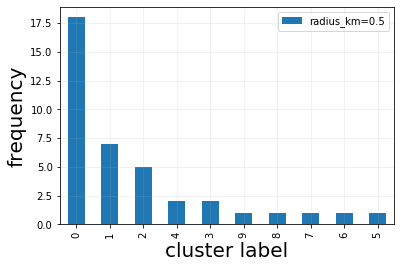

In [29]:
cl_05_u_tdf['cluster'].value_counts().plot(kind='bar', label='radius_km=0.5')
plt.grid(alpha=0.2)
plt.xlabel('cluster label', fontsize=20)
plt.ylabel('frequency', fontsize=20)
plt.legend()
plt.show()

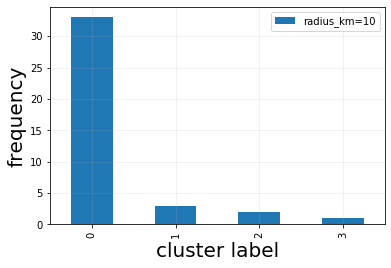

In [30]:
cl_10_u_tdf['cluster'].value_counts().plot(kind='bar', label='radius_km=10')
plt.grid(alpha=0.2)
plt.xlabel('cluster label', fontsize=20)
plt.ylabel('frequency', fontsize=20)
plt.legend()
plt.show()

### 2.G What is the minimum value of `radius_km` such that we have exactly two clusters? Visualize the trajectory and the clustering obtained.

In [31]:
import numpy as np

In [32]:
radii_km = np.arange(1, 50, 1)
for radius_km in radii_km:
    n_clusters = len(clustering.cluster(scf_u_tdf, cluster_radius_km=radius_km)['cluster'].unique())
    if n_clusters == 2:
        min_radius_km_2clusters = radius_km
        break
cl_u_tdf = clustering.cluster(scf_u_tdf, cluster_radius_km=radius_km)

In [33]:
map_f = u_tdf.plot_trajectory(opacity=0.5, hex_color='red', weight=5,
                          start_end_markers=False, zoom=4)
cl_u_tdf.plot_stops(map_f=map_f)

### 2.H Plot the value of `radius_km` versus the number of clusters, vary `radius_km` from `100m` to first value of `radius_km` such that we obtain just one cluster.

In [34]:
radii_km = list(np.arange(0.1, 1, 0.1)) + list(np.arange(1, 2001, 1))
n_clusters_list = []
for radius_km in tqdm(radii_km):
    n_clusters = len(clustering.cluster(scf_u_tdf, cluster_radius_km=radius_km)['cluster'].unique())
    n_clusters_list.append(n_clusters)
    if n_clusters == 1:
        break
print(radius_km)

 56%|█████▌    | 1128/2009 [00:39<00:33, 25.92it/s]

1122


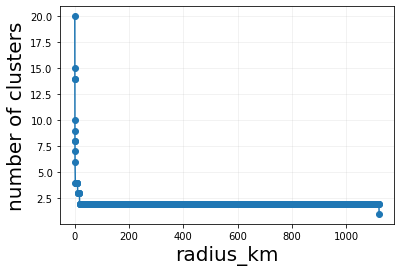

In [36]:
plt.plot(radii_km[:len(n_clusters_list)], n_clusters_list, marker='o')
plt.xlabel('radius_km', fontsize=20)
plt.ylabel('number of clusters', fontsize=20)
plt.grid(alpha=0.2)